### Plotting ERA5 Temps, Heights, and Winds

Grace Dines 2/16/23

In [2]:
import xarray as xr
import numpy as np
import pandas as pd
from pandas.tseries.offsets import MonthEnd,MonthBegin
import cartopy.feature as cfeature
import cartopy.crs as ccrs
import requests
from datetime import datetime, timedelta
import metpy.calc as mpcalc
from metpy.units import units
import matplotlib.pyplot as plt

Below, I'm loading in the ERA5 data that has been regridded and reduced down in another script

In [3]:
t_ds = xr.open_dataset("/home11/grad/2021/gd673524/research/gdines/data/ERA5_rd/t_rd.nc")
u_ds = xr.open_dataset("/home11/grad/2021/gd673524/research/gdines/data/ERA5_rd/u_rd.nc")
v_ds = xr.open_dataset("/home11/grad/2021/gd673524/research/gdines/data/ERA5_rd/v_rd.nc")
g_ds = xr.open_dataset("/home11/grad/2021/gd673524/research/gdines/data/ERA5_rd/g_rd.nc")

In [4]:
#Selecting Only 0z so that it matches the S2S data
t0z_ds = t_ds.sel(time = t_ds.time.dt.hour == 0)
u0z_ds = u_ds.sel(time = u_ds.time.dt.hour == 0)
v0z_ds = v_ds.sel(time = v_ds.time.dt.hour == 0)
z0z_ds = g_ds.sel(time = g_ds.time.dt.hour == 0)

In [5]:
#Creating data arrays for each variable
T_kelvin = t0z_ds['t']
T_cel = t0z_ds['t']-273.15
U = u0z_ds['u']
V = v0z_ds['v']
Z = z0z_ds['z']

In [6]:
#Adding units to variables
U = U * units('m/s')
V = V * units('m/s')
Z = Z * units('meters')
T = T_cel * units('degC')
Z_dam = Z.metpy.convert_units('dam')

In [7]:
## Convert wind from m/s to knots; using MetPy to calculate the wind speed.
UKts = U.metpy.convert_units('knots')
VKts = V.metpy.convert_units('knots')
## Calculate windspeed.
wspdKts = mpcalc.wind_speed(UKts,VKts)

In [8]:
#Creating Variables for time, lat, and lon
lons, lats, times= T.lon, T.lat, T.time

In [9]:
#This will select the contour intervals depending on the pressure level chosen
def pick_contour_lev(pLevel):
    if (pLevel == 1000):
        zLevels= np.arange(-900,630, 30)
        tLevels= np.arange(-28,38, 2)
        wndLevels= np.arange(-5,70, 5)
    elif (pLevel == 850):
        zLevels = np.arange(600, 1830, 30)
        tLevels = np.arange(-30,20, 2)
        wndLevels = np.arange(-10, 80, 10)
    elif (pLevel == 700):
        zLevels = np.arange(2010, 3390, 30)
        tLevels = np.arange(-35,10, 2)
        wndLevels = np.arange(-20, 120, 10)
    elif (pLevel == 500):
        zLevels = np.arange(4680, 6060, 60)
        tLevels = np.arange(-40,0, 2)
        wndLevels = np.arange(-20, 150, 10)
    elif (pLevel == 250):
        zLevels = np.arange(9270, 13050, 90)
        tLevels = np.arange(-70,-30, 2)
        wndLevels = np.arange(-20, 200, 10)
    return(zLevels, tLevels, wndLevels)

In [10]:
#These variables are needed in order to create the proper map projection
lonW = -160
lonE = -60
latS = 15.0
latN = 75.0
cLon = (lonW + lonE) / 2.
cLat = (latS + latN) / 2.
proj_map = ccrs.LambertConformal(central_longitude=cLon, central_latitude=cLat)
proj_data = ccrs.PlateCarree() # Our data is lat-lon; thus its native projection is Plate Carree.
res = '110m'
constrainLon = 3.3

In [11]:
#This definition will create a faceted plot featuring temperature and height for each day of the data.
#The only input needed is the desired pressure level.

def makeTZ_map(pLevel):
    
    fig, ax = plt.subplots(10,5, figsize=(20, 30), subplot_kw={'projection': proj_map}, 
                           transform=ccrs.PlateCarree(), constrained_layout=True)
    fig.suptitle(f'ERA-5 Temperatures and Heights at {pLevel}hPa at 0Z', fontsize=30)
    ax=ax.flatten()
    for i in np.arange(0,50,1):
        ax[i].add_feature(cfeature.COASTLINE.with_scale(res))
    
    # Add the title to subplots
        valTime = pd.to_datetime(T.isel(time=i).time.values).strftime("%m/%d/%Y")
        ax[i].set_title(f'{valTime}', size=20)
        
    # Z contour lines
        CL = ax[i].contour(lons,lats,Z_dam.isel(time=i).sel(level=pLevel),pick_contour_lev(pLevel)[0],linewidths=1.25,
                           colors='black', transform=proj_data)
        ax[i].clabel(CL, inline_spacing=0.2, fontsize=8, fmt='%.0f')
    
    # T contour fills
        CF = ax[i].contourf(lons,lats,T_cel.isel(time=i).sel(level=pLevel),pick_contour_lev(pLevel)[1],cmap='RdBu_r',
                            extend='both', transform=proj_data)

        cbar_ax = fig.add_axes([1,0.15,.02,0.75])
        cbar = fig.colorbar(CF,cbar_ax,orientation='vertical')
        cbar.set_label(r'Temps (°C)', size=20, weight='bold')
        cbar.ax.tick_params(labelsize=18) 

In [12]:
#This definition will create a faceted plot with windspeed contour filled and heights contoured 
#for each day of the data. The only input needed is the desired pressure level.

def makewndZ_map(pLevel):
    
    fig, ax = plt.subplots(10,5, figsize=(20, 30), subplot_kw={'projection': proj_map}, 
                           transform=ccrs.PlateCarree(), constrained_layout=True)
    fig.suptitle(f'ERA-5 Winds and Heights at {pLevel}hPa at 0Z', fontsize=30)
    ax=ax.flatten()
    #looping over the days that I want to plot (only focused on Jan and beginning of Feb
    for i in np.arange(0,50,1):
        ax[i].add_feature(cfeature.COASTLINE.with_scale(res))
    
    # Add the title to subplots
        valTime = pd.to_datetime(Z_dam.isel(time=i).time.values).strftime("%m/%d/%Y")
        ax[i].set_title(f'{valTime}', size=20)
        
    # Z contour lines
        CL = ax[i].contour(lons,lats,Z_dam.isel(time=i).sel(level=pLevel),pick_contour_lev(pLevel)[0],linewidths=1.25,
                           colors='black', transform=proj_data)
        ax[i].clabel(CL, inline_spacing=0.2, fontsize=8, fmt='%.0f')
    
    # Wind contour fills
        CF = ax[i].contourf(lons,lats,wspdKts.isel(time=i).sel(level=pLevel),pick_contour_lev(pLevel)[2],cmap='BuPu',
                            extend='both', transform=proj_data)

        cbar_ax = fig.add_axes([1,0.15,.02,0.75])
        cbar = fig.colorbar(CF,cbar_ax,orientation='vertical')
        cbar.set_label('Winds (kts)', size=20, weight='bold')
        cbar.ax.tick_params(labelsize=18) 

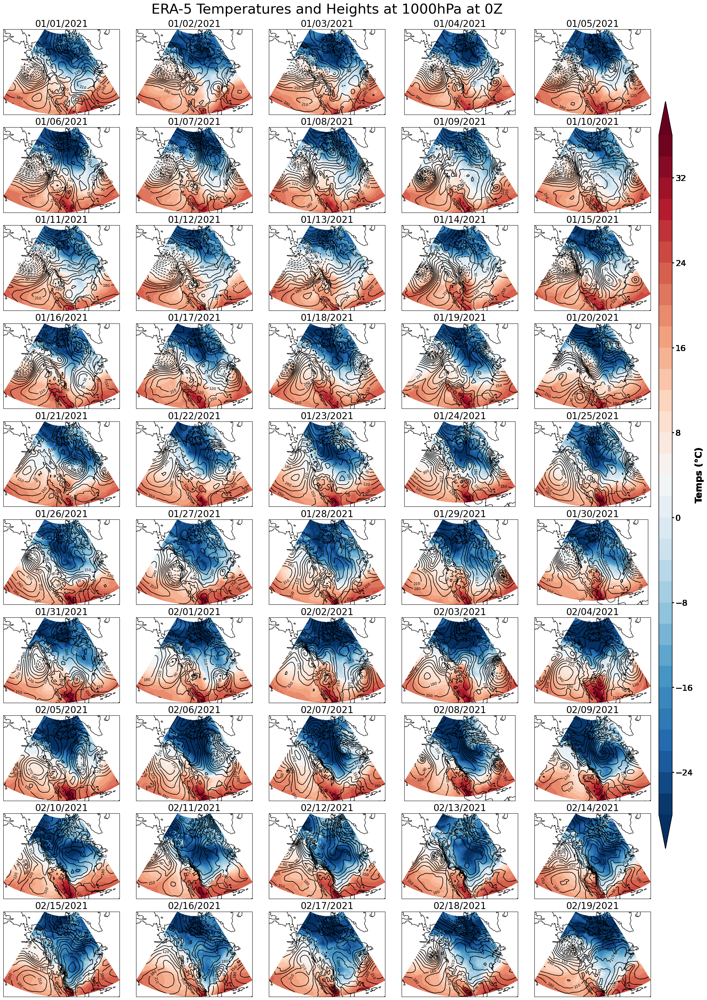

In [12]:
#This cell will create the temperature and height maps
##The different possible inputs: 1000, 850, 700, 500, 250 
makeTZ_map(1000)

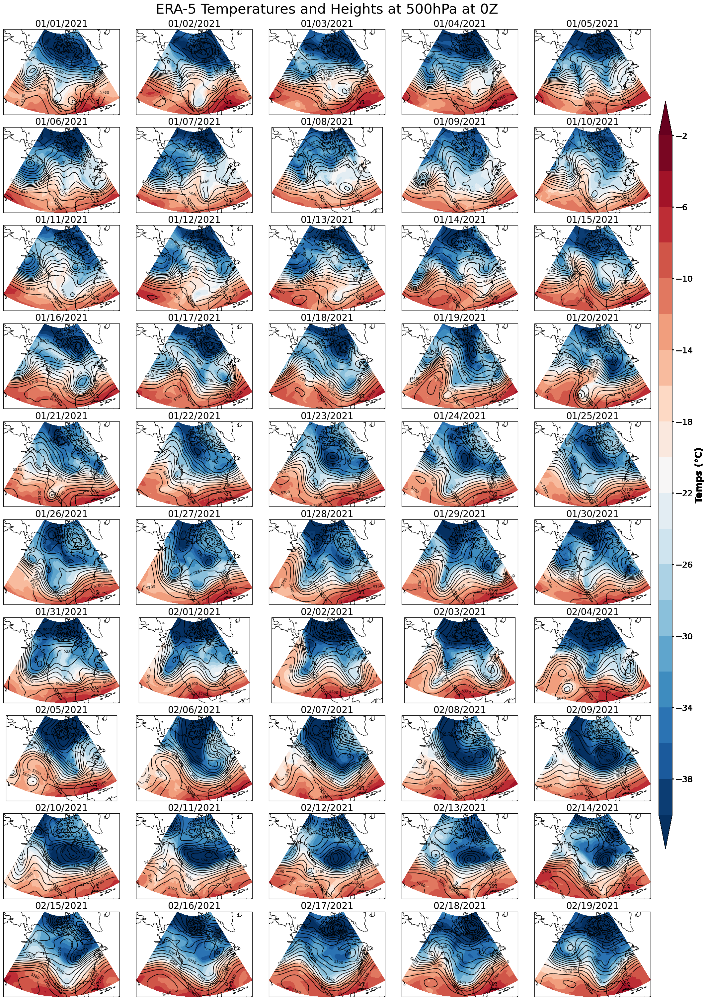

In [13]:
makeTZ_map(500)

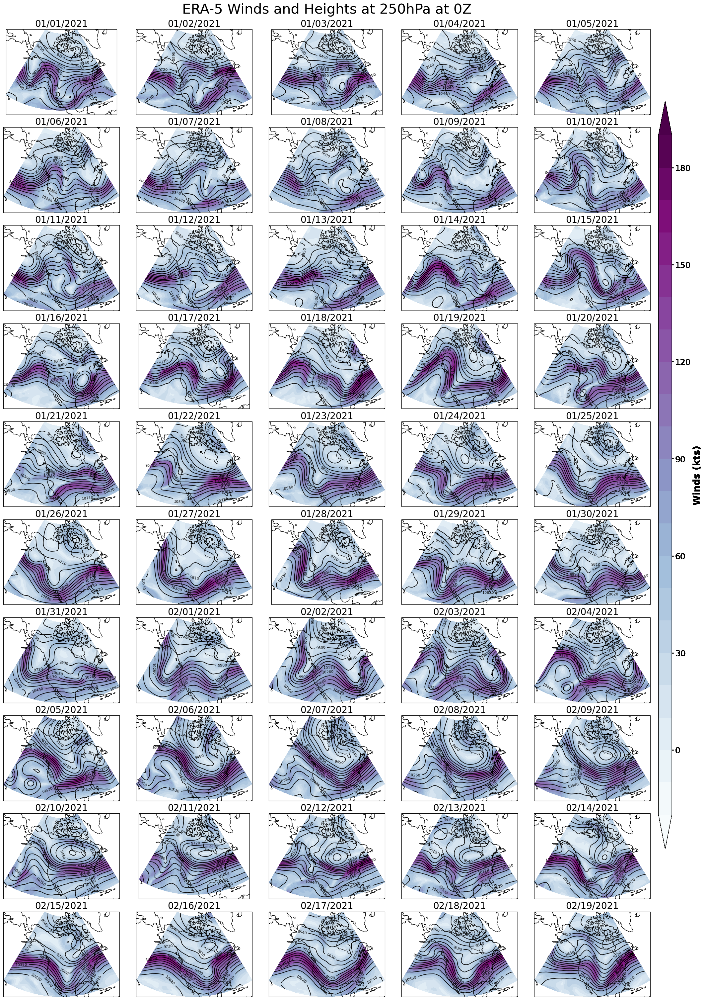

In [13]:
#This cell will create the wind and height maps
##The different possible inputs: 1000, 850, 700, 500, 250 
makewndZ_map(250)

Below is the code for the maps that I included in my master's presentation
 

In [10]:
#Selecting the data for the time frame that I want the gifs to cover
T_lesstime = T.isel(time=slice(25,53))
Z_dam_lesstime = Z_dam.isel(time=slice(25,53))
T_cel_lesstime = T_cel.isel(time=slice(25,53))
wspdKts_lesstime = wspdKts.isel(time=slice(25,53))

In [16]:
#This definition will create a faceted plot featuring temperature and height for each day of the data.
#The only input needed is the desired pressure level.

def makeTZ_map_gif(pLevel, times_i_want):
    
    fig, ax = plt.subplots(1,1, figsize=(10, 10), subplot_kw={'projection': proj_map}, 
                           transform=ccrs.PlateCarree(), constrained_layout=True)
    ax.add_feature(cfeature.COASTLINE.with_scale(res))
    ax.add_feature (cfeature.STATES.with_scale(res))
    
    # Add the title to plots
    valTime = pd.to_datetime(T_lesstime.isel(time=times_i_want).time.values).strftime("%m/%d/%Y")
    plt.title(f'{valTime}: ERA-5 Temperatures and Heights at {pLevel}hPa at 0Z', fontsize=22)
    # Z contour lines
    CL = ax.contour(lons,lats,Z_dam_lesstime.isel(time=times_i_want).sel(level=pLevel),pick_contour_lev(pLevel)[0],linewidths=1.25,
                           colors='black', transform=proj_data)
    ax.clabel(CL, inline_spacing=0.2, fontsize=8, fmt='%.0f')
    
    # T contour fills
    CF = ax.contourf(lons,lats,T_cel_lesstime.isel(time=times_i_want).sel(level=pLevel),pick_contour_lev(pLevel)[1],cmap='RdBu_r',
                            extend='both', transform=proj_data)

    cbar_ax = fig.add_axes([1,0.15,.02,0.75])
    cbar = fig.colorbar(CF,cbar_ax,orientation='vertical')
    cbar.set_label(r'Temps (°C)', size=12, weight='bold')
    cbar.ax.tick_params(labelsize=12) 

In [17]:
#This definition will create a faceted plot featuring temperature and height for each day of the data.
#The only input needed is the desired pressure level.

def makewind_map_gif(pLevel, times_i_want):
    
    fig, ax = plt.subplots(1,1, figsize=(10, 10), subplot_kw={'projection': proj_map}, 
                           transform=ccrs.PlateCarree(), constrained_layout=True)
    ax.add_feature(cfeature.COASTLINE.with_scale(res))
    ax.add_feature (cfeature.STATES.with_scale(res))
    
    # Add the title to plots
    valTime = pd.to_datetime(Z_dam_lesstime.isel(time=times_i_want).time.values).strftime("%m/%d/%Y")
    plt.title(f'{valTime}: ERA-5 Winds and Heights at {pLevel}hPa at 0Z', fontsize=22)
    # Z contour lines
    CL = ax.contour(lons,lats,Z_dam_lesstime.isel(time=times_i_want).sel(level=pLevel),pick_contour_lev(pLevel)[0],linewidths=1.25,
                           colors='black', transform=proj_data)
    ax.clabel(CL, inline_spacing=0.2, fontsize=8, fmt='%.0f')
    
    # Wind contour fills
    CF = ax.contourf(lons,lats, wspdKts_lesstime.isel(time=times_i_want).sel(level=pLevel),pick_contour_lev(pLevel)[2],cmap='BuPu',
                            extend='both', transform=proj_data)

    cbar_ax = fig.add_axes([1,0.15,.02,0.75])
    cbar = fig.colorbar(CF,cbar_ax,orientation='vertical')
    cbar.set_label(r'Winds (kts)', size=12, weight='bold')
    cbar.ax.tick_params(labelsize=12) 

In [18]:
num_figs_4gif = 28

In [23]:
# Loop to create multiple figures at 500-hPa plotting temps and heights
base_path = f'/home11/grad/2021/gd673524/research/gdines/era5_plots/500temp_plots_4gif/Era5_temps500hPa_'
for i in range(num_figs_4gif):
    fig = makeTZ_map_gif(500, i)
    val2save = str(i).zfill(2)
    # Save the figure to a specific location
    save_path = base_path + val2save + '.png'
    plt.savefig(save_path, bbox_inches='tight')
    plt.close(fig)

In [24]:
# Loop to create multiple figures at 1000-hPa plotting temps and heights
base_path = f'/home11/grad/2021/gd673524/research/gdines/era5_plots/1000temp_plots_4gif/Era5_temps1000hPa_'
for i in range(num_figs_4gif):
    fig = makeTZ_map_gif(1000, i)
    val2save = str(i).zfill(2)
    # Save the figure to a specific location
    save_path = base_path + val2save + '.png'
    plt.savefig(save_path, bbox_inches='tight')
    plt.close(fig)

In [21]:
# Loop to create multiple figures at 250-hPa plotting winds and heights
base_path = f'/home11/grad/2021/gd673524/research/gdines/era5_plots/250wind_plots_4gif/Era5_wind250hPa_'
for i in range(num_figs_4gif):
    fig = makewind_map_gif(250, i)
    val2save = str(i).zfill(2)
    # Save the figure to a specific location
    save_path = base_path + val2save + '.png'
    plt.savefig(save_path, bbox_inches='tight')
    plt.close(fig)

** I converted these images into gifs in the command line using 

Step 1: 

Save image files in ascending order (e.g., myfile_N.png) where N is a variable increasing in value. You’ll need to make sure you use string formatting to convert integer N to a formatted string so that ‘1’ would be ‘01’ otherwise, image 10 gets mixed in between images 1 and 2. 

Step 2: 

In the terminal, type: 

   ls -1 myfile*png 

This is a LS –one, which will list your myfile images in the order they will be animated, make sure they're in the right order. 

Step 3: 

In the terminal, type:  

    convert -delay 15 -loop 0 path/myfile*png  path/myfile.gif 

 - path is the working directory path

 - the -delay number is the number of milliseconds between the images, to emphasize timesteps you could try 25 

 - -loop number is the number of times to replay the animation, 0 means never stop looping. 

 - myfile.gif will be the output animated gif. 

 - path is the working directory path
